It is highly recommended to use a powerful **GPU**, you can use it for free uploading this notebook to [Google Colab](https://colab.research.google.com/notebooks/intro.ipynb).
<table align="center">
 <td align="center"><a target="_blank" href="https://colab.research.google.com/github/ezponda/intro_deep_learning_solutions/blob/main/class/CNN/Classical_Architectures_CNN.ipynb">
        <img src="https://i.ibb.co/2P3SLwK/colab.png"  style="padding-bottom:5px;" />Run in Google Colab</a></td>
  <td align="center"><a target="_blank" href="https://github.com/ezponda/intro_deep_learning_solutions/blob/main/class/CNN/Classical_Architectures_CNN.ipynb">
        <img src="https://i.ibb.co/xfJbPmL/github.png"  height="70px" style="padding-bottom:5px;"  />View Source on GitHub</a></td>
</table>

**Classic network architectures:**

- LeNet-5
- AlexNet
- VGG 16
经典 CNN 家族（以“加深/加宽”为主）

LeNet-5 (1998)：手写体识别鼻祖，浅层小网络（适合 32×32 灰度）。

AlexNet (2012)：上面已述。

VGG-16 (2014)：3×3 小卷积堆叠成深网络（13 conv + 3 fc），统一而简洁；但参数量/计算量很大（尤其全连接）。

**Modern network architectures:**

- Inception
- ResNet
- ResNeXt
- DenseNet

现代 CNN 家族（以“结构模块化/连接策略”为主）

Inception / GoogLeNet (2014)：同层并行多尺度卷积(1×1/3×3/5×5) + 1×1 降维，计算更省。

ResNet (2015)：残差连接（skip connections）解决深层梯度消失，网络可做得很深（50/101/152…）。

ResNeXt (2017)：在 ResNet 基础上引入组卷积/基数(cardinality)，更高效地提升容量。

DenseNet (2017)：密集连接（层与层全部相连），特征复用强、参数更少但显存占用较高。

（补充：实际工程更常用 MobileNet/EfficientNet 系列——移动端与高效 SOTA）

# AlexNet

AlexNet is the name of CNN, designed by  [Alex Krizhevsky](https://www.cs.toronto.edu/~kriz/) . AlexNet is considered one of the most influential papers published in computer vision, as of 2020, the paper has been cited over 70,000 times according to Google Scholar.

AlexNet competed in the [ImageNet](https://en.wikipedia.org/wiki/ImageNet) Large Scale Visual Recognition Challenge (1000 different classes) on September 30, 2012. The network achieved a top-5 error of 15.3%, more than 10.8 percentage points lower than that of the runner up.

AlexNet consists of 5 Convolutional Layers and 3 Fully Connected Layers.


<img src="https://i.ibb.co/CBp6sfy/Alex-Net-architecture.png" alt="Alex-Net-architecture" border="0" />

AlexNet（2012）

结构：输入 227×227×3 → Conv(11, stride 4) → MaxPool → Conv(5) → MaxPool → Conv(3)×3 → MaxPool → FC 4096 → FC 4096 → FC 1000(Softmax)。共 5 个卷积层 + 3 个全连接层。

关键创新：

用 ReLU（训练更快）、Dropout(0.5)（防过拟合）、数据增广（随机裁剪/翻转）、局部响应归一化 LRN（后来被 BN 取代）。

多 GPU 分裂训练（当年显存不足的解决方案）。

指标：ImageNet 2012 Top-5 error ≈ 15.3%（比第二名低 10.8 个点）。

局限：大核(11×11, 5×5) + 巨大 FC 层(4096×2) → 参量多、计算重；现今多被更高效的架构替代。

In [1]:
img_shape = (227, 227, 3)
n_classes = 1000

In [2]:
import tensorflow as tf
from tensorflow import keras

from tensorflow.keras.layers import Dense, Activation, Dropout, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.layers import BatchNormalization
import numpy as np

alexnet = tf.keras.Sequential()

# Layer 1
alexnet.add(Conv2D(filters=96, kernel_size=(11, 11), input_shape=img_shape))
alexnet.add(BatchNormalization())
alexnet.add(Activation('relu'))
alexnet.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

# Layer 2
alexnet.add(Conv2D(filters=256, kernel_size=(5, 5)))
alexnet.add(BatchNormalization())
alexnet.add(Activation('relu'))
alexnet.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

# Layer 3
alexnet.add(Conv2D(filters=384, kernel_size=(3, 3)))
alexnet.add(BatchNormalization())
alexnet.add(Activation('relu'))
alexnet.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

# Layer 4
alexnet.add(Conv2D(filters=384, kernel_size=(3, 3)))
alexnet.add(BatchNormalization())
alexnet.add(Activation('relu'))

# Layer 5
alexnet.add(Conv2D(filters=256, kernel_size=(3, 3)))
alexnet.add(BatchNormalization())
alexnet.add(Activation('relu'))
alexnet.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

## Fully-connected
# Layer 6
alexnet.add(Flatten())
alexnet.add(Dense(4096, activation='relu'))
alexnet.add(Dropout(0.5))

# Layer 7
alexnet.add(Dense(4096, activation='relu'))
alexnet.add(Dropout(0.5))

# Layer 8
alexnet.add(Dense(n_classes, activation='softmax'))

alexnet.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 217, 217, 96)   │        34,944 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 217, 217, 96)   │           384 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 217, 217, 96)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 108, 108, 96)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 104, 104, 256)  │       614,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 104, 104, 256)  │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 104, 104, 256)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 52, 52, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 50, 50, 384)    │       885,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 50, 50, 384)    │         1,536 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 50, 50, 384)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 25, 25, 384)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 23, 23, 384)    │     1,327,488 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 23, 23, 384)    │         1,536 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 23, 23, 384)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 21, 21, 256)    │       884,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 21, 21, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 21, 21, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 10, 10, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25600)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 4096)           │   104,861,696 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 129,492,712 (493.98 MB)

 Trainable params: 129,489,960 (493.96 MB)

 Non-trainable params: 2,752 (10.75 KB)

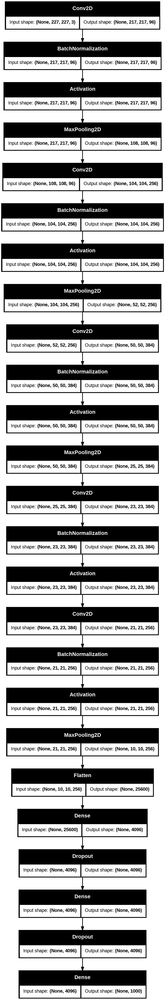

In [3]:
from tensorflow.keras.utils import plot_model
plot_model(alexnet, show_shapes=True)

In [4]:
def show_loss_accuracy_evolution(history):

    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Sparse Categorical Crossentropy')
    ax1.plot(hist['epoch'], hist['loss'], label='Train Error')
    ax1.plot(hist['epoch'], hist['val_loss'], label='Val Error')
    ax1.grid()
    ax1.legend()

    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.plot(hist['epoch'], hist['accuracy'], label='Train Accuracy')
    ax2.plot(hist['epoch'], hist['val_accuracy'], label='Val Accuracy')
    ax2.grid()
    ax2.legend()

    plt.show()

# LeNet-5

LeNet-5 is a classical CNN that was introduced back to 1998, is designed to recognize the digits from 0 to 9.

LeNet-5 is such a classical model that it consists of two convolution layers followed by average pooling layers for each and apply three fully connected layers in the end of the network. In the original paper **sigmoid** activation function was used.

<img src="https://i.ibb.co/y4KJH39/LeNet-5.png" alt="LeNet-5" border="0">

11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
x_train shape: (60000, 28, 28, 1)
60000 train samples
10000 test samples


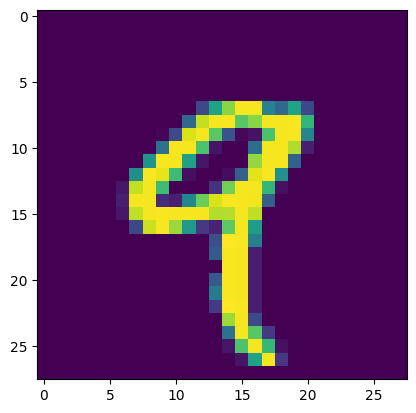

In [5]:
import matplotlib.pyplot as plt
%matplotlib inline

# Model / data parameters
num_classes = 10
img_shape = (28, 28, 1)

# load data, split between train and test sets
(train_images, train_labels), (test_images, test_labels) = tf.keras.datasets.mnist.load_data()

# Scale images to the [0, 1] range
x_train = train_images.astype("float32") / 255
x_test = test_images.astype("float32") / 255

# Make sure images have shape (28, 28, 1)
x_train = np.expand_dims(x_train, -1)
x_test = np.expand_dims(x_test, -1)
print("x_train shape:", x_train.shape)
print(x_train.shape[0], "train samples")
print(x_test.shape[0], "test samples")


# convert class vectors to binary class matrices
y_train = tf.keras.utils.to_categorical(train_labels, num_classes)
y_test = tf.keras.utils.to_categorical(test_labels, num_classes)

plt.imshow(train_images[4])
plt.show()

### Create the model

Model original architecture:

- **First conv layer**: 6 filters of 3x3, sigmoid activation + Average Pooling
- **Second conv layer**: 16 filters of 3x3, sigmoid activation + Average Pooling
- **Flatten layer**
- **Dense layer**: 120 units, sigmoid activation
- **Dense layer**: 84 units, sigmoid activation
- **Output layer**: 10 units (classes), softmax activation

In [8]:
## sigmoids and layers.AveragePooling2D
from tensorflow.keras import layers

from tensorflow.keras import layers

model_old = keras.Sequential()

model_old.add(layers.Conv2D(filters=6, kernel_size=(3, 3), activation='sigmoid', input_shape=img_shape))
model_old.add(layers.AveragePooling2D(pool_size=(2, 2)))

model_old.add(layers.Conv2D(filters=16, kernel_size=(3, 3), activation='sigmoid'))
model_old.add(layers.AveragePooling2D(pool_size=(2, 2)))

model_old.add(layers.Flatten())

model_old.add(layers.Dense(units=120, activation='sigmoid'))

model_old.add(layers.Dense(units=84, activation='sigmoid'))

model_old.add(layers.Dense(units=10, activation = 'softmax'))

model_old.compile(
    optimizer='adam',
    loss='CategoricalCrossentropy',
    metrics=['accuracy']
)
history = model_old.fit(x_train, y_train, batch_size=32 ,epochs=5, validation_split=0.2, verbose=1)

Epoch 1/5
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 24s 14ms/step - accuracy: 0.3709 - loss: 1.7396 - val_accuracy: 0.9028 - val_loss: 0.3289
Epoch 2/5
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 23s 15ms/step - accuracy: 0.9016 - loss: 0.3202 - val_accuracy: 0.9377 - val_loss: 0.2112
Epoch 3/5
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 20s 13ms/step - accuracy: 0.9348 - loss: 0.2162 - val_accuracy: 0.9514 - val_loss: 0.1629
Epoch 4/5
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 21s 14ms/step - accuracy: 0.9496 - loss: 0.1654 - val_accuracy: 0.9594 - val_loss: 0.1398
Epoch 5/5
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 21s 14ms/step - accuracy: 0.9601 - loss: 0.1285 - val_accuracy: 0.9620 - val_loss: 0.1249


In [9]:
results = model_old.evaluate(x_test, y_test, verbose=1)
print('Test Loss: {}'.format(results[0]))
print('Test Accuracy: {}'.format(results[1]))

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9548 - loss: 0.1390
Test Loss: 0.12431512773036957
Test Accuracy: 0.9610999822616577


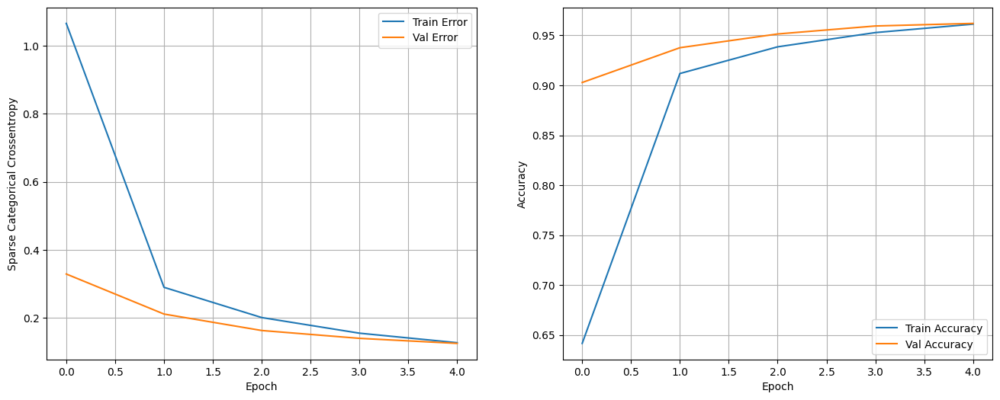

In [10]:
import pandas as pd
show_loss_accuracy_evolution(history)

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step


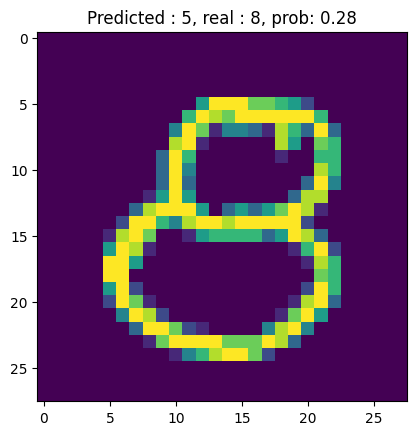

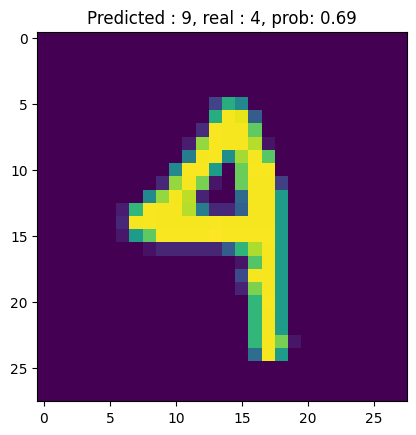

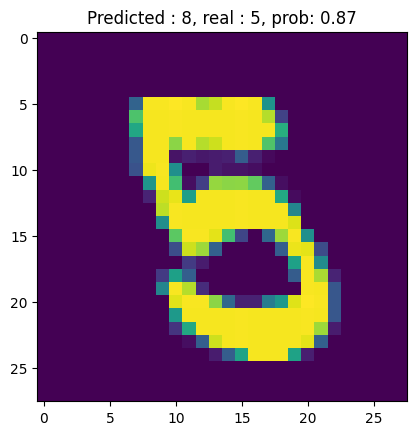

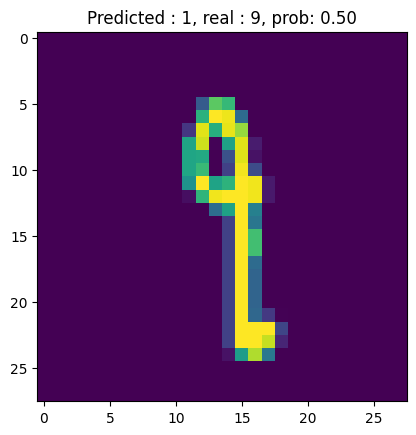

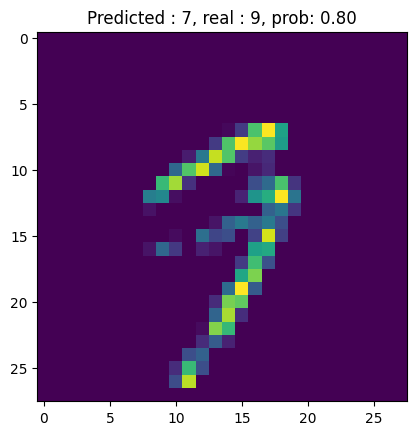

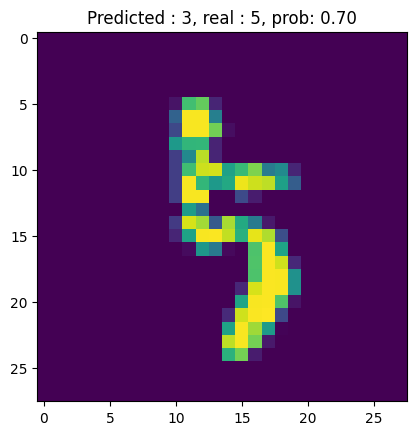

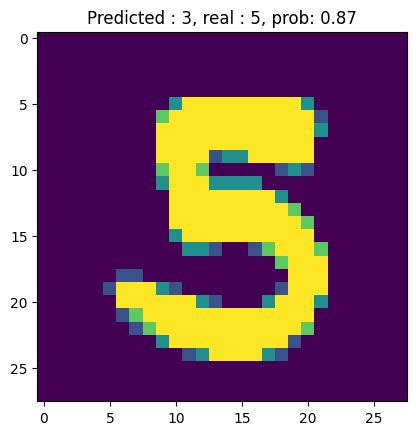

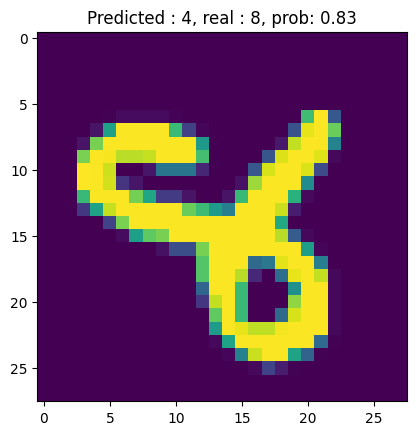

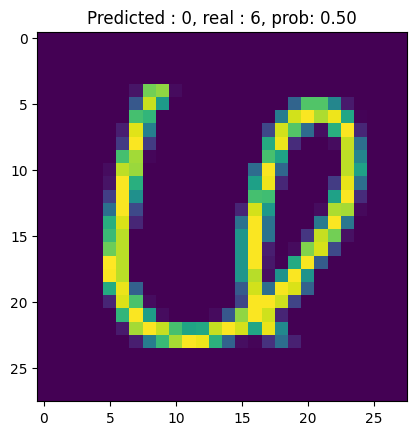

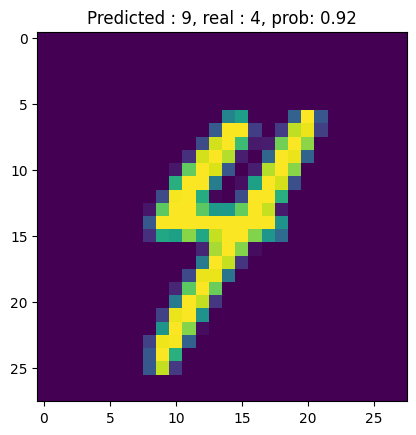

In [11]:
def show_errors(x_test, model, y_test, n_samples=10):
    labels = y_test.argmax(axis=-1).astype(np.int32)
    predictions = model.predict(x_test)
    preds = predictions.argmax(axis=-1).astype(np.int32)
    preds_prob = predictions.max(axis=-1)

    bad_pred_inds = np.where(preds != labels)[0]
    n_samples = min(len(bad_pred_inds), n_samples)
    samples_inds = np.random.choice(bad_pred_inds, n_samples)
    for ind in samples_inds:
        title = 'Predicted : {0}, real : {1}, prob: {2:.2f}'.format(
            int(preds[ind]), labels[ind], preds_prob[ind])
        plt.imshow(x_test[ind, :, :, 0])
        plt.title(title)
        plt.show()
        print()
    return


show_errors(x_test, model_old, y_test, n_samples=10)

### Improve the model

- **First conv layer**: 6 filters of 3x3, relu activation + Max Pooling
- **Second conv layer**: 16 filters of 3x3, relu activation + Max Pooling
- **Flatten layer**
- **Dense layer**: 120 units, relu activation
- **Dense layer**: 84 units, relu activation
- **Output layer**: 10 units (classes), softmax activation
Use relu instead sigmoids and MaxPooling2D, try any regularization

In [12]:
## relu and layers.MaxPooling2D

model = keras.Sequential()

model.add(layers.Conv2D(filters=6, kernel_size=(3, 3), activation='relu', input_shape=img_shape))
model.add(layers.MaxPooling2D())

model.add(layers.Dropout(0.3))

model.add(layers.Conv2D(filters=16, kernel_size=(3, 3), activation='relu'))
model.add(layers.MaxPooling2D())

model.add(layers.Dropout(0.3))

model.add(layers.Flatten())

model.add(layers.Dense(units=120, activation='relu'))

model.add(layers.Dense(units=84, activation='relu'))

model.add(layers.Dense(units=10, activation = 'softmax'))

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
history = model.fit(x_train, y_train, batch_size=128 ,epochs=5, validation_split=0.2, verbose=1)

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
375/375 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step - accuracy: 0.6896 - loss: 0.9658 - val_accuracy: 0.9625 - val_loss: 0.1396
Epoch 2/5
375/375 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - accuracy: 0.9319 - loss: 0.2180 - val_accuracy: 0.9737 - val_loss: 0.0921
Epoch 3/5
375/375 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step - accuracy: 0.9506 - loss: 0.1606 - val_accuracy: 0.9768 - val_loss: 0.0825
Epoch 4/5
375/375 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step - accuracy: 0.9569 - loss: 0.1320 - val_accuracy: 0.9819 - val_loss: 0.0617
Epoch 5/5
375/375 ━━━━━━━━━━━━━━━━━━━━ 16s 43ms/step - accuracy: 0.9625 - loss: 0.1175 - val_accuracy: 0.9833 - val_loss: 0.0562


In [13]:
results = model.evaluate(x_test, y_test, verbose=1)
print('Test Loss: {}'.format(results[0]))
print('Test Accuracy: {}'.format(results[1]))

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9801 - loss: 0.0636
Test Loss: 0.052971214056015015
Test Accuracy: 0.983299970626831


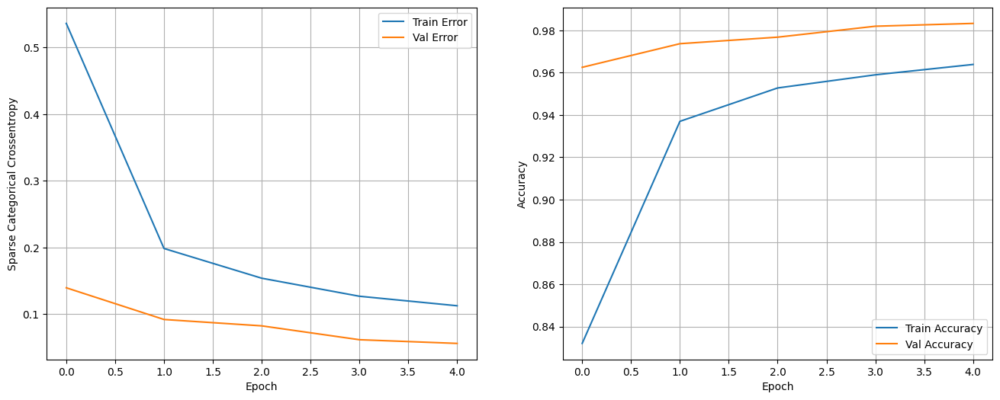

In [14]:
import pandas as pd
show_loss_accuracy_evolution(history)

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step


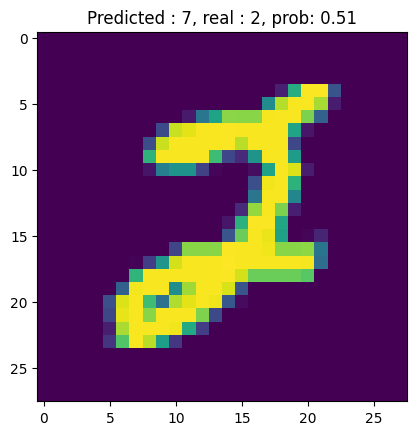

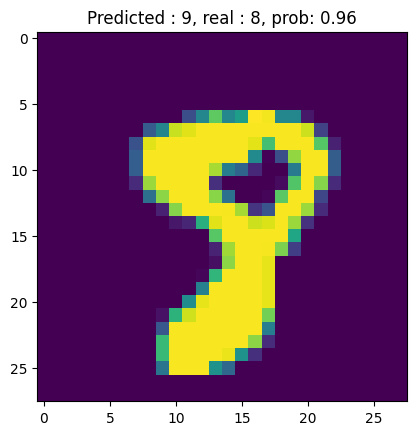

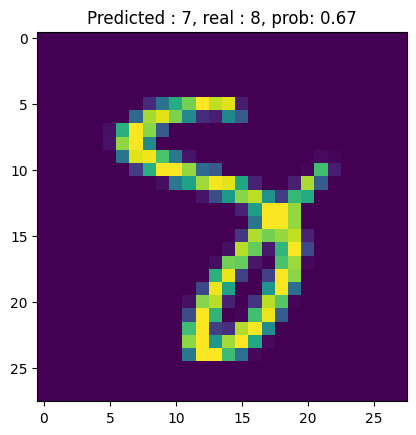

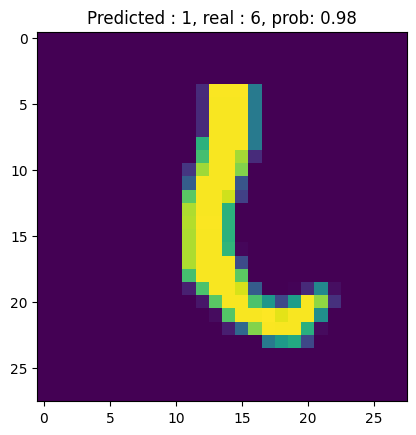

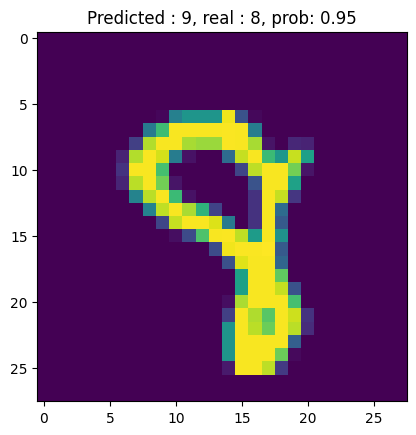

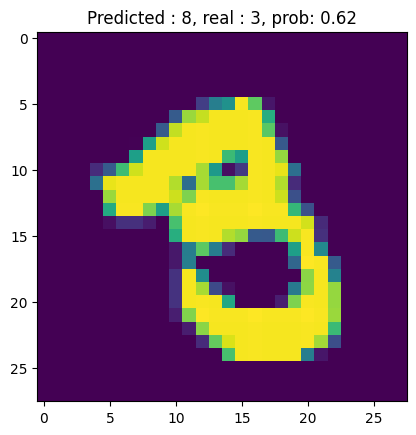

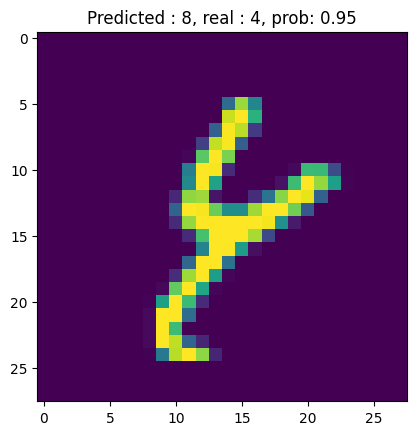

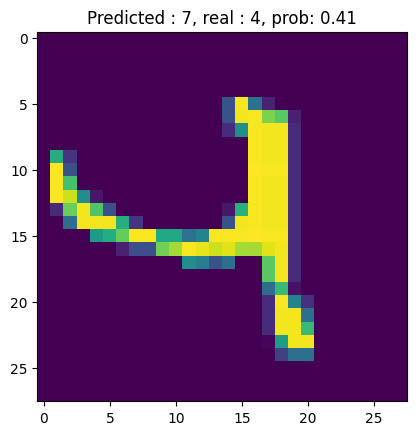

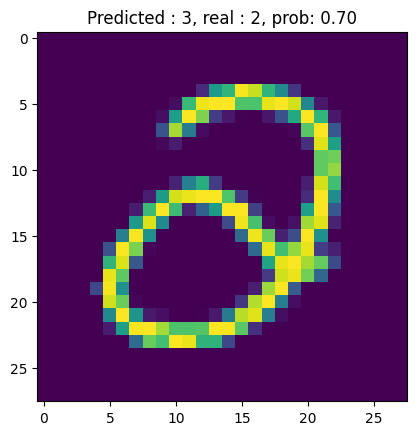

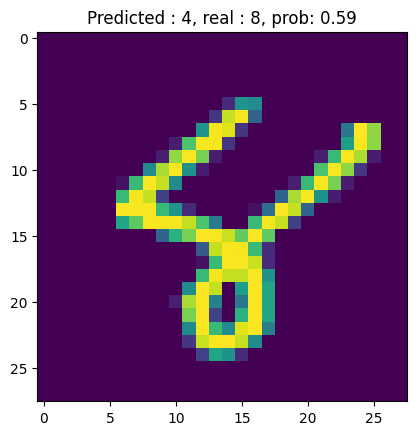

In [15]:
show_errors(x_test, model, y_test, n_samples=10)

#### Take a photo and predict


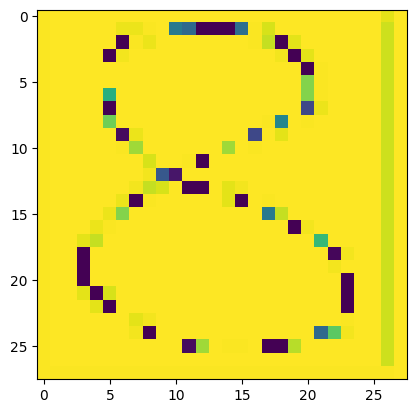

In [17]:
def read_image(image_path, target_size=None, grayscale=False):
    image = tf.keras.preprocessing.image.load_img(image_path,
                                                  target_size=target_size,
                                                  color_mode='grayscale')
    image = tf.keras.preprocessing.image.img_to_array(image)
    image = image.astype(np.uint8)
    return image


#img_path = '../images/digit.png'
url = 'https://i.ibb.co/3h7mLN1/digit.png'
image_path = tf.keras.utils.get_file("digit_8.png", url)
img = read_image(image_path, target_size=(28, 28), grayscale=True)

plt.imshow(np.squeeze(img))
plt.show()

In [18]:
x = np.expand_dims(img, 0)
x = x / 255.0
print(x.shape)
print('Old model character: {0} with probability: {1}'.format(model_old.predict(x).argmax(), model_old.predict(x).max()))
print('Improved model character: {0} with probability: {1}'.format(model.predict(x).argmax(), model.predict(x).max()))

(1, 28, 28, 1)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Old model character: 3 with probability: 0.5857238173484802
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Improved model character: 0 with probability: 0.5860210657119751


# VGG-16

VGG16 is a convolutional neural network model proposed by K. Simonyan and A. Zisserman from the University of Oxford in the paper “Very Deep Convolutional Networks for Large-Scale Image Recognition”. The model achieves 92.7% top-5 test accuracy in ImageNet. VGG16 was trained for weeks and was using NVIDIA Titan Black GPU’s

<img src="https://i.ibb.co/QYfBNKm/vgg-16.png" alt="vgg-16" border="0">

加载 VGG16 预训练主干做迁移学习

In [26]:
model_VGG16 = tf.keras.applications.VGG16(
    include_top=False,
    weights="imagenet",
    classes=1000,
    input_shape=(256, 256, 3),
)
model_VGG16.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 256, 256, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 256, 256, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 128, 128, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 128, 128, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 64, 64, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 64, 64, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 64, 64, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 32, 32, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 32, 32, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 32, 32, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 16, 16, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 8, 8, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

In [27]:
# summarize filter shapes
for i, layer in enumerate(model_VGG16.layers):
    # check for convolutional layer
    if 'conv' not in layer.name:
        continue
    # get filter weights
    filters, biases = layer.get_weights()
    print(i, layer.name, filters.shape)

1 block1_conv1 (3, 3, 3, 64)
2 block1_conv2 (3, 3, 64, 64)
4 block2_conv1 (3, 3, 64, 128)
5 block2_conv2 (3, 3, 128, 128)
7 block3_conv1 (3, 3, 128, 256)
8 block3_conv2 (3, 3, 256, 256)
9 block3_conv3 (3, 3, 256, 256)
11 block4_conv1 (3, 3, 256, 512)
12 block4_conv2 (3, 3, 512, 512)
13 block4_conv3 (3, 3, 512, 512)
15 block5_conv1 (3, 3, 512, 512)
16 block5_conv2 (3, 3, 512, 512)
17 block5_conv3 (3, 3, 512, 512)


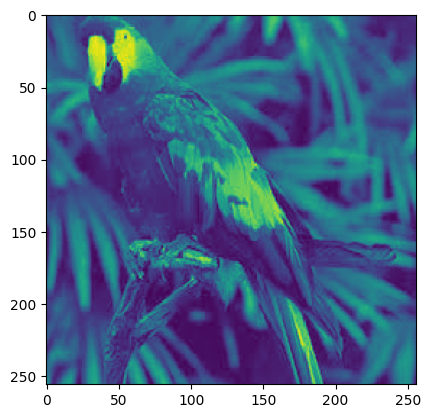

In [30]:
img_folder = '../../images'
url = 'https://i.ibb.co/q5TFmqh/bird.jpg'
#url = 'https://i.ibb.co/vd1SqSM/The-grandeur-of-the-Taj-Mahal-and-its-intricate-stone-inlays-immediately-greets-the-visitor-upon-ent.jpg'
image_path = tf.keras.utils.get_file("bird.jpg", url)
# image_path = '../../images/bird.jpeg'
image = read_image(image_path, target_size=(256, 256))
img = np.expand_dims(image, axis=0)
plt.imshow(image)

In [33]:
from tensorflow.keras.models import Model

# Get the symbolic outputs of each "key" layer (we gave them unique names).
outputs_dict = {layer.name: layer.output for layer in model_VGG16.layers}
# Set up a model that returns the activation values for every layer in
# VGG19 (as a dict).
feature_extractor = keras.Model(inputs=model_VGG16.inputs,
                                outputs=outputs_dict)

In [34]:
from tensorflow.keras.utils import load_img, img_to_array
import tensorflow as tf
import numpy as np

# 1) 读成 RGB 三通道，尺寸 256x256
pil = load_img(image_path, target_size=(256, 256), color_mode='rgb')
arr = img_to_array(pil)                # (256, 256, 3) float32

# 2) 加 batch 维
x = np.expand_dims(arr, 0)             # (1, 256, 256, 3)

# 3) VGG16 专用预处理（BGR + 减均值），dtype 需 float32
x = tf.keras.applications.vgg16.preprocess_input(x.astype('float32'))

# 4) 送入特征提取器
features = feature_extractor(x)        # dict: {layer_name: tensor}
print(list(features.keys())[:5])


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_442']
Received: inputs=Tensor(shape=(1, 256, 256, 3))
  warnings.warn(msg)


['input_layer_6', 'block1_conv1', 'block1_conv2', 'block1_pool', 'block2_conv1']


In [36]:
## Get the features of the image
features = feature_extractor(x)
print(features.keys())
#print(list(features.items())[0])

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_442']
Received: inputs=Tensor(shape=(1, 256, 256, 3))
  warnings.warn(msg)


dict_keys(['input_layer_6', 'block1_conv1', 'block1_conv2', 'block1_pool', 'block2_conv1', 'block2_conv2', 'block2_pool', 'block3_conv1', 'block3_conv2', 'block3_conv3', 'block3_pool', 'block4_conv1', 'block4_conv2', 'block4_conv3', 'block4_pool', 'block5_conv1', 'block5_conv2', 'block5_conv3', 'block5_pool'])


（从输入图到“抽取 VGG16 特征”）

加载预训练主干

model_VGG16 = tf.keras.applications.VGG16(include_top=False, weights='imagenet', input_shape=(256,256,3))

只要“卷积特征提取器”，不用原来的 1000 类全连接头（迁移学习常规做法）。

把“所有关键层的输出”收集成一个模型

outputs_dict = {layer.name: layer.output for layer in model_VGG16.layers}

feature_extractor = keras.Model(inputs=model_VGG16.inputs, outputs=outputs_dict)

之后喂一张图，就能一次拿到每一层的激活（特征图）。

读入图片并调整尺寸

load_img(path, target_size=(256,256), color_mode='rgb')

一定要 RGB 三通道，因为 VGG16 要求输入 (batch, H, W, 3)。

加 batch 维

x = np.expand_dims(arr, 0) → 从 (256,256,3) 变成 (1,256,256,3)，模型推理需要批次维度。

做 VGG16 的“专用预处理”

x = tf.keras.applications.vgg16.preprocess_input(x.astype('float32'))

这一步会把 RGB 转为 BGR 并减去 ImageNet 的通道均值（与 VGG16 预训练时完全对齐）。

注意：这和简单的 /255 不一样，VGG16 要用自己的预处理。

送入特征提取器拿到每层激活

features = feature_extractor(x) → 返回 dict {层名: 张量}，如 block1_conv1、block1_pool …

你打印了 features.keys()，确认能取到每层的特征。

feature_maps first hidden layer shape:  (1, 256, 256, 64)


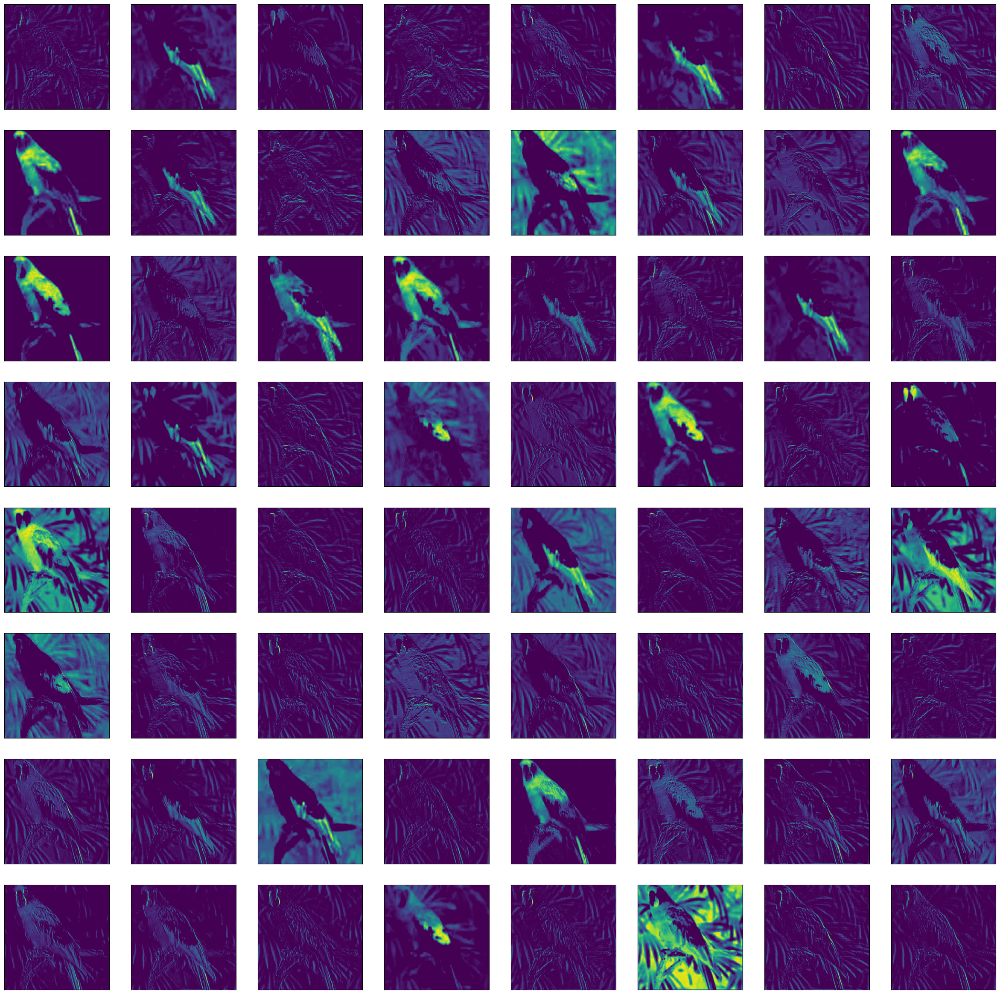

In [37]:
# get feature map for first hidden layer
feature_maps = features['block1_conv1']
print('feature_maps first hidden layer shape: ', feature_maps.shape)
# plot all 64 maps in an 8x8 squares
square = 8
ix = 1
plt.figure(figsize=(30, 30))
for _ in range(square):
    for _ in range(square):
        # specify subplot and turn of axis
        ax = plt.subplot(square, square, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        # plot filter channel in viridis or gray
        plt.imshow(feature_maps[0, :, :, ix - 1], cmap='viridis')
        ix += 1
# show the figure
plt.show()

feature_maps shape:  (1, 64, 64, 256)


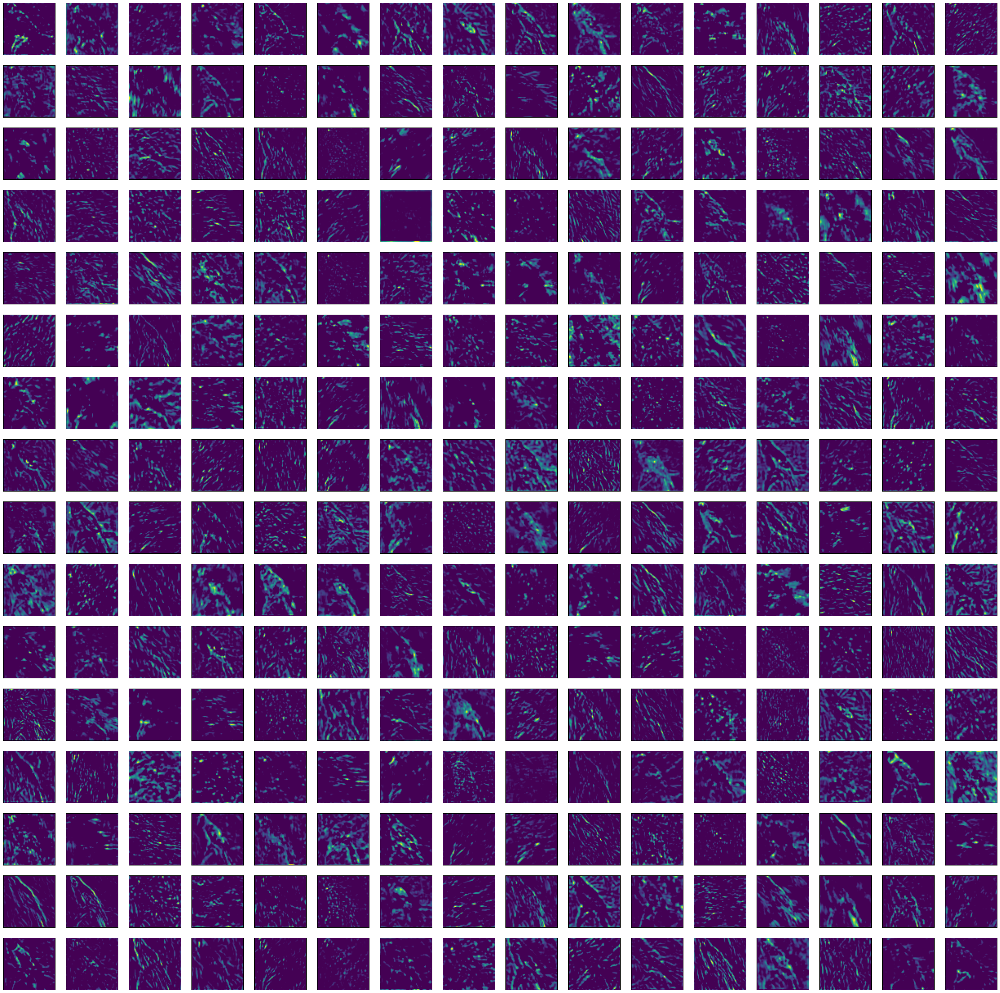

In [38]:
# block3_conv3
feature_maps = features['block3_conv3']
print('feature_maps shape: ', feature_maps.shape)

# plot all 256 maps in an 16x16 squares
square = 16
ix = 1
plt.figure(figsize=(40, 40))
for _ in range(square):
    for _ in range(square):
        # specify subplot and turn of axis
        ax = plt.subplot(square, square, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        # plot filter channel in grayscale
        plt.imshow(feature_maps[0, :, :, ix - 1], cmap='viridis')
        ix += 1
# show the figure
plt.show()

In [39]:
features.keys()

dict_keys(['input_layer_6', 'block1_conv1', 'block1_conv2', 'block1_pool', 'block2_conv1', 'block2_conv2', 'block2_pool', 'block3_conv1', 'block3_conv2', 'block3_conv3', 'block3_pool', 'block4_conv1', 'block4_conv2', 'block4_conv3', 'block4_pool', 'block5_conv1', 'block5_conv2', 'block5_conv3', 'block5_pool'])

In [ ]:
feature_maps = features['block1_conv2']
print('feature_maps shape: ', feature_maps.shape)
for i in range(feature_maps.shape[-1]):
    plt.xticks([])
    plt.yticks([])
    plt.imshow(feature_maps[0, :, :, i], cmap='viridis')
    plt.show()

In [ ]:
feature_maps = features['block1_pool']
print('feature_maps shape: ', feature_maps.shape)
for i in range(feature_maps.shape[-1]):
    plt.xticks([])
    plt.yticks([])
    plt.imshow(feature_maps[0, :, :, i], cmap='viridis')
    plt.show()